In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from manuscript_functions.cell_type_annotation import *
from manuscript_functions.colors import default_cmap, cmap_24, healthy_ct_cmap, nh_ct_cmap, blast_vs_rest
import umap.umap_ as umap
import plotly.express as px

/Users/adr/miniconda3/envs/iPC_test/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
sns.set_context("paper")

In [3]:
all_trans_expr = pd.read_csv("/Users/adr/Box/iPC_work/Local_files_for_paper/Updated/Transformed/myeloid_expr_transformed.csv", index_col=0)
all_meta = pd.read_csv("/Users/adr/Box/iPC_work/Local_files_for_paper/Updated/monocytic_meta_TP_patient_file_cluster.csv",
                  index_col=0)
remission_bool = np.load("/Users/adr/Box/iPC_work/Local_files_for_paper/Updated/fileID_myeloid_healthy_bool.npy")


In [4]:
rem_trans_expr = all_trans_expr[remission_bool]
nh_trans_expr = all_trans_expr[~remission_bool]

rem_meta = all_meta[remission_bool].reset_index(drop=True)
nh_meta = all_meta[~remission_bool].reset_index(drop=True)

In [5]:
rem_trans_expr.shape[0] + nh_trans_expr.shape[0] == all_trans_expr.shape[0]

True

In [6]:
all_scaler = MinMaxScaler()
all_scaler.fit(all_trans_expr)


MinMaxScaler()

# Remission cells

In [7]:
rem_clusters = pd.read_csv("/Users/adr/Box/iPC_work/Local_files_for_paper/Updated/Healthy_fileID_ClustConsistency/all_clusterings.csv")
rem_clust = pd.DataFrame(rem_clusters["k50_n6_clusters"])


In [8]:
# Scaling cells
all_scaled_rem_expr = pd.DataFrame(all_scaler.transform(rem_trans_expr), columns=rem_trans_expr.columns)

In [9]:
annotation = {
 0: "HSPCs",
 1: "Monocyte",
 2: "Monocyte",
 3: "Monocyte",
 4: "Monocyte",
 5: "Monocyte",
 6: "Monocyte",
 7: "Pro-Monocyte",
 8: "Pro-Monocyte",
 9: "Pro-Monocyte",
10: "HSPCs",
11: "Monoblasts/Myeloblasts",
12: "HSPCs",
13: "Monoblasts/Myeloblasts",
14: "Pro-Monocyte",
15: "HSPCs",
16: "debris",
17: "debris",
18: "debris"
}



In [10]:
rem_meta["cell_type"] = [annotation[clust] for clust in rem_clust["k50_n6_clusters"]]
rem_meta

,time_point,patient_id,file_id,cluster_id,cell_type
0,EOI I,PAVRJP,10,24,Monocyte
1,EOI I,PAVRJP,10,24,Pro-Monocyte
2,EOI I,PAVRJP,10,24,Monocyte
3,EOI I,PAVRJP,10,24,Pro-Monocyte
4,EOI I,PAVRJP,10,24,Monocyte
...,...,...,...,...,...
31326,EOI I,TEST12378,42,23,Monocyte
31327,EOI I,TEST12378,42,23,Monocyte
31328,EOI I,TEST12378,42,23,Monocyte
31329,EOI I,TEST12378,42,23,Monocyte


## Scaled with all cells

<module 'matplotlib.pyplot' from '/Users/adr/miniconda3/envs/iPC_test/lib/python3.8/site-packages/matplotlib/pyplot.py'>

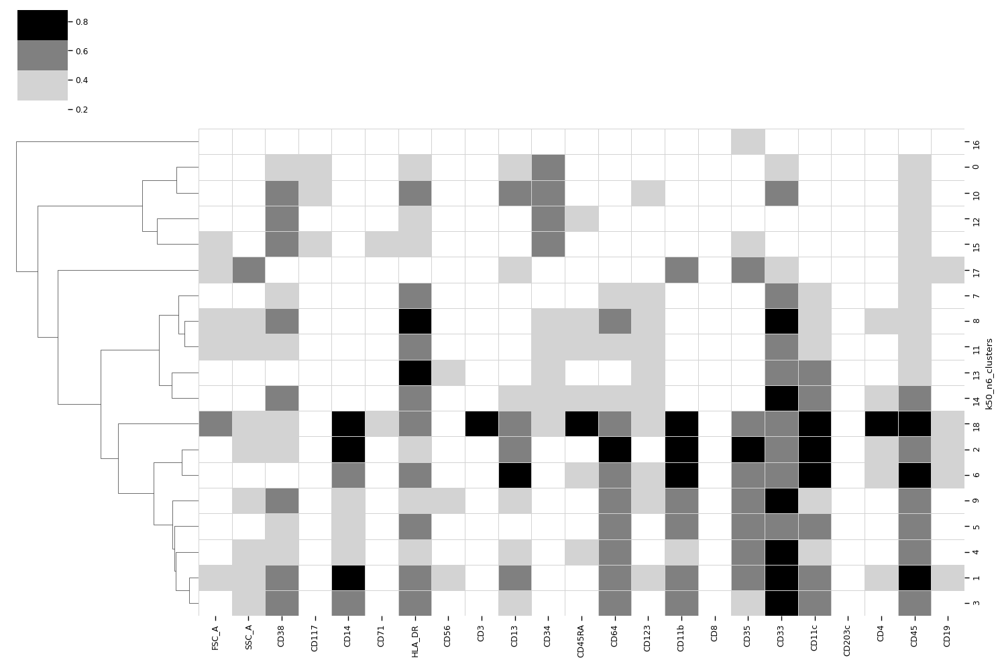

In [11]:
plot_bw_heatmap(all_scaled_rem_expr, meta_data = rem_clust, group_var="k50_n6_clusters")

/Users/adr/miniconda3/envs/iPC_test/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


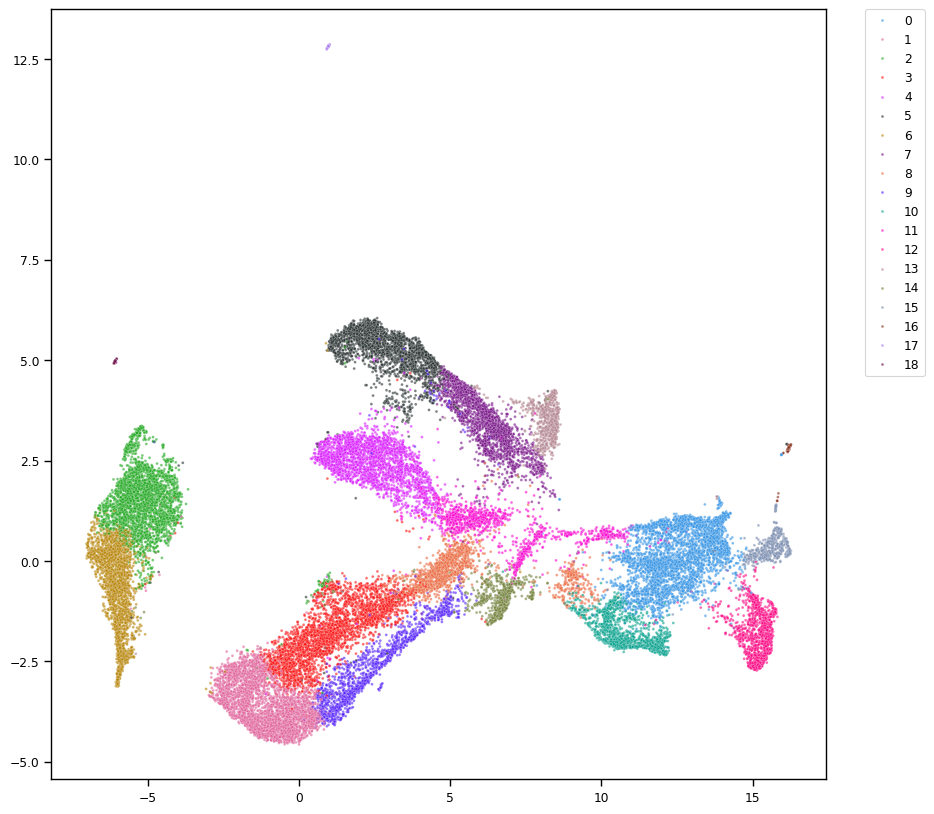

In [13]:
Y2 = umap.UMAP(random_state=123).fit_transform(all_scaled_rem_expr)
plt.figure(figsize=(10, 10))
sns.scatterplot(x=Y2[:,0], y=Y2[:,1], hue=rem_clust["k50_n6_clusters"].astype("category"), alpha=0.6, s=4, 
                palette=cmap_24[:len(rem_clust["k50_n6_clusters"].unique())])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

<module 'matplotlib.pyplot' from '/Users/adr/miniconda3/envs/iPC_test/lib/python3.8/site-packages/matplotlib/pyplot.py'>

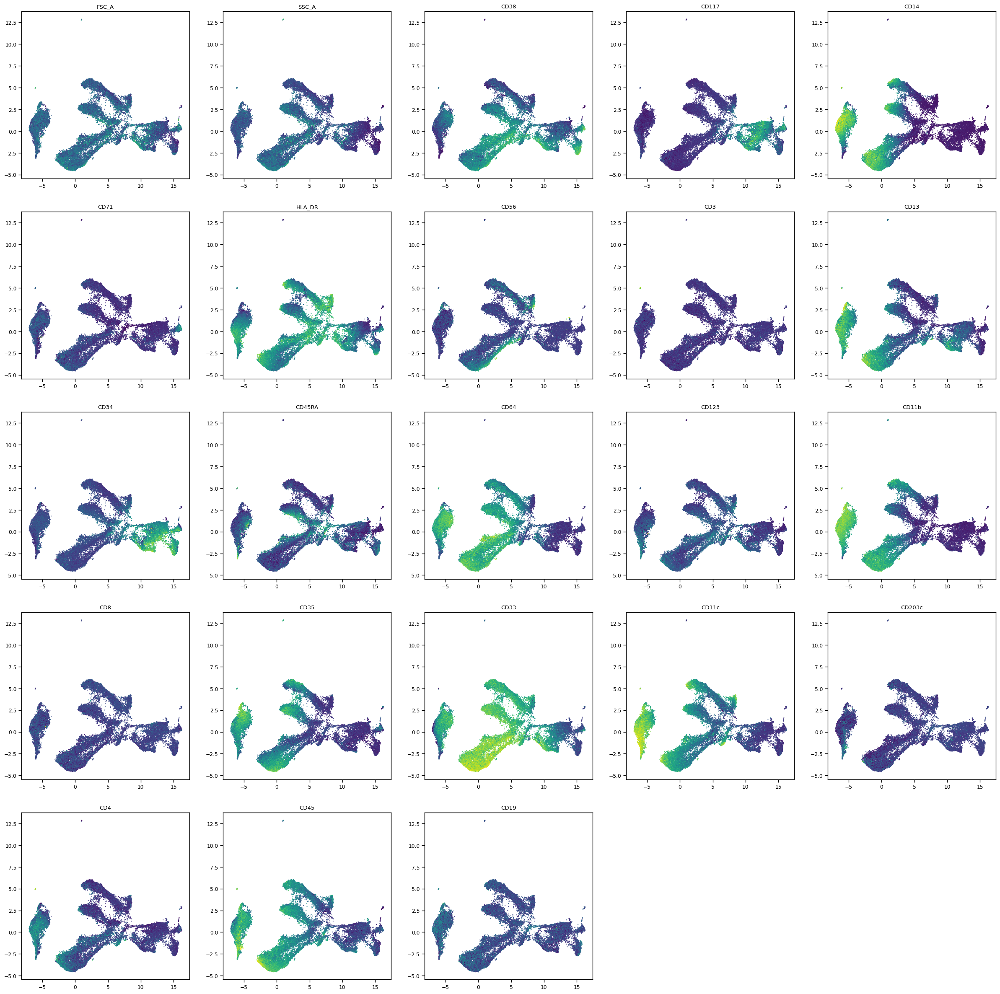

In [14]:
plot_all_markers(Y2, all_scaled_rem_expr, all_scaled_rem_expr.columns, cmap="viridis")

<Axes: >

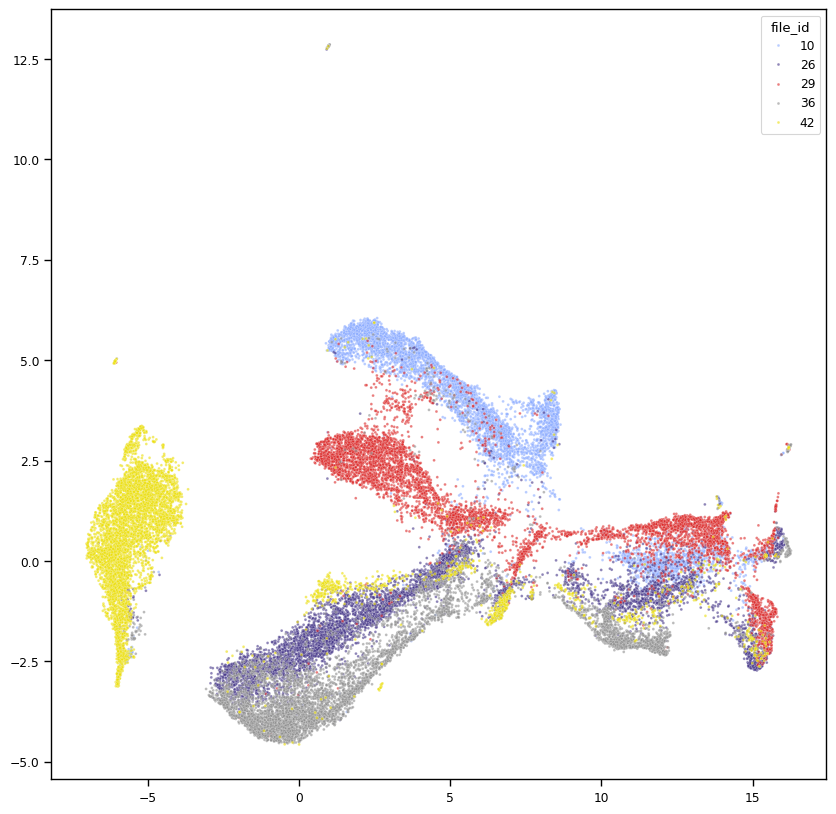

In [16]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x=Y2[:,0], y=Y2[:,1], hue=rem_meta["file_id"].astype("category"), alpha=0.6, s=4, 
               palette=default_cmap[:5])

<Axes: >

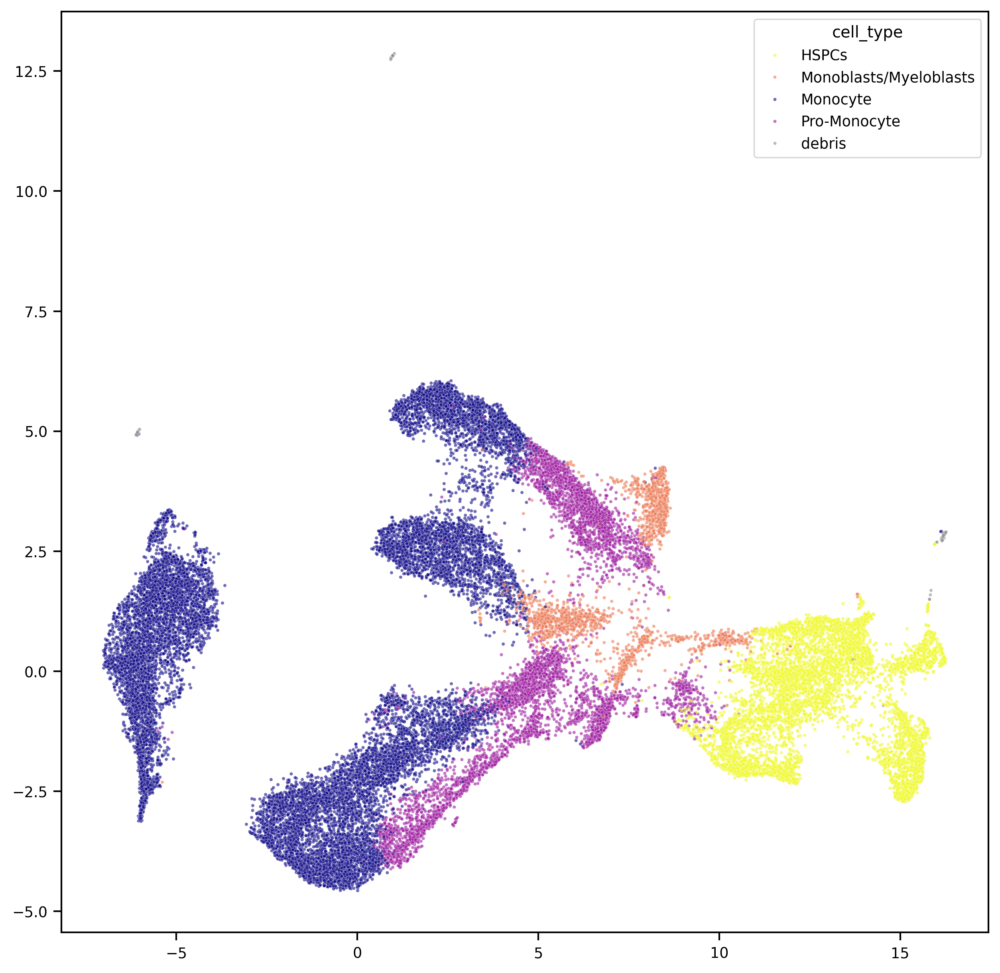

In [17]:
plt.figure(figsize=(10, 10), dpi=300)
sns.scatterplot(x=Y2[:,0], y=Y2[:,1], hue=rem_meta["cell_type"].astype("category"), alpha=0.6, s=4,
               palette=healthy_ct_cmap)
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Figure1/remission_cell_UMAP_cell_type.pdf")
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Figure1/remission_cell_UMAP_cell_type.png")



<module 'matplotlib.pyplot' from '/Users/adr/miniconda3/envs/iPC_test/lib/python3.8/site-packages/matplotlib/pyplot.py'>

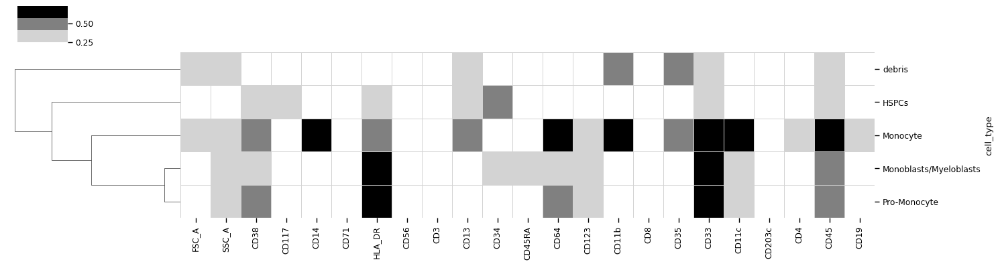

In [18]:
plot_bw_heatmap(all_scaled_rem_expr, meta_data=rem_meta, group_var="cell_type", fig_size=(15,4))
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Figure1/remission_cells_heatmap_avg_expr_per_cell_type.pdf")
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Figure1/remission_cells_heatmap_avg_expr_per_cell_type.png")


# Non remission cells

In [19]:
nh_clusters = pd.read_csv("/Users/adr/Box/iPC_work/Local_files_for_paper/Updated/NH_fileID_ClustConsistency/all_clusterings.csv")
nh_clust = pd.DataFrame(nh_clusters["k50_n5_clusters"])


In [20]:
blast_clust = [2, 3 ,4 , 5, 6 , 9, 10, 16, 18, 23, 27, 30, 7, 8, 21, 22]
monocyte_clust = [17, 26]
proMonocyte_clust = [12, 20, 14]
anno_clust = blast_clust+monocyte_clust+proMonocyte_clust

blast_dict = {clust_id: "Blast" for clust_id in nh_clust["k50_n5_clusters"].unique() if clust_id in blast_clust }
mono_dict = {clust_id: "Monocyte" for clust_id in nh_clust["k50_n5_clusters"].unique() if clust_id in monocyte_clust }
pm_dict = {clust_id: "Pro-Monocyte?" for clust_id in nh_clust["k50_n5_clusters"].unique() if clust_id in proMonocyte_clust }
remain_dict = {clust_id: "Not_defined" for clust_id in nh_clust["k50_n5_clusters"].unique() if clust_id not in anno_clust }

anno_dict = {**blast_dict, **mono_dict, **pm_dict, **remain_dict}

nh_meta["cell_type"] = [anno_dict[clust] for clust in nh_clust["k50_n5_clusters"]]
nh_meta


,time_point,patient_id,file_id,cluster_id,cell_type
0,Diagnosis,PAUMTZ,0,20,Pro-Monocyte?
1,Diagnosis,PAUMTZ,0,20,Pro-Monocyte?
2,Diagnosis,PAUMTZ,0,20,Pro-Monocyte?
3,Diagnosis,PAUMTZ,0,20,Pro-Monocyte?
4,Diagnosis,PAUMTZ,0,20,Pro-Monocyte?
...,...,...,...,...,...
318914,Relapse,PAXMLI,41,5,Blast
318915,Relapse,PAXMLI,41,5,Blast
318916,Relapse,PAXMLI,41,5,Blast
318917,Relapse,PAXMLI,41,5,Blast


In [21]:
# Scaling cells
all_scaled_nh_expr  =  pd.DataFrame(all_scaler.transform(nh_trans_expr), columns=nh_trans_expr.columns)

## Scaling with all cells

In [22]:
colors = ["#DC050C", "#FB8072", "#1965B0", "#7BAFDE", "#882E72",
          "#B17BA6", "#FF7F00", "#FDB462", "#CFE3E2", "#E78AC3",
          "#33A02C", "#B2DF8A", "#55A1B1", "#8DD3C7", "#A6761D",
          "#E6AB02", "#7570B3", "#BEAED4", "#666666", "#999999",
          "#AA8282", "#D4B7B7", "#8600BF", "#BA5CE3", "#808000",
          "#AEAE5C", "#1E90FF", "#00BFFF", "#56FF0D", "#FFFF00",
          "#8B3800", "#0A0D05", "#4E8500", "#2F2C62", "#D70131",
          "#83B54A", "#E7298A", "#7229E7", "#E7DCFA", "#F5F2DA"]

In [23]:
len(colors)

40

In [24]:
Y5 = umap.UMAP(random_state=123).fit_transform(all_scaled_nh_expr)

/Users/adr/miniconda3/envs/iPC_test/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Text(1.4, 10.5, '14')

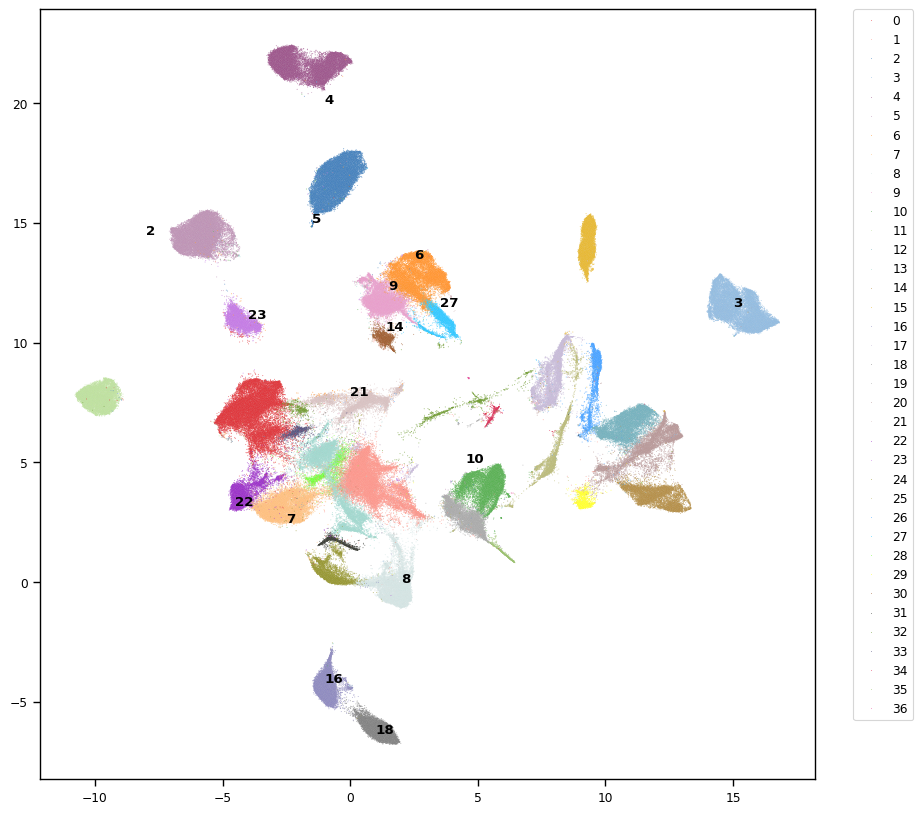

In [38]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x=Y5[:,0], y=Y5[:,1], hue=nh_clust["k50_n5_clusters"].astype("category"), 
                alpha=0.6, s=0.5, palette=colors[:len(nh_clust["k50_n5_clusters"].unique())])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.text(-8, 14.5, "2", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-1.5, 15, "5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-1, 20, "4", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-4, 11, "23", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(15, 11.5, "3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-1, -4.2, "16", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(1, -6.3, "18", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(2, 0, "8", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(4.5, 5, "10", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-4.5, 3.2, "22", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-2.5, 2.5, "7", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(0, 7.8, "21", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(2.5, 13.5, "6", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(3.5, 11.5, "27", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(1.5, 12.2, "9", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(1.4, 10.5, "14", horizontalalignment='left', size='medium', color='black', weight='semibold')
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Figure1/non_remission_cell_UMAP_clusters.png")


<module 'matplotlib.pyplot' from '/Users/adr/miniconda3/envs/iPC_test/lib/python3.8/site-packages/matplotlib/pyplot.py'>

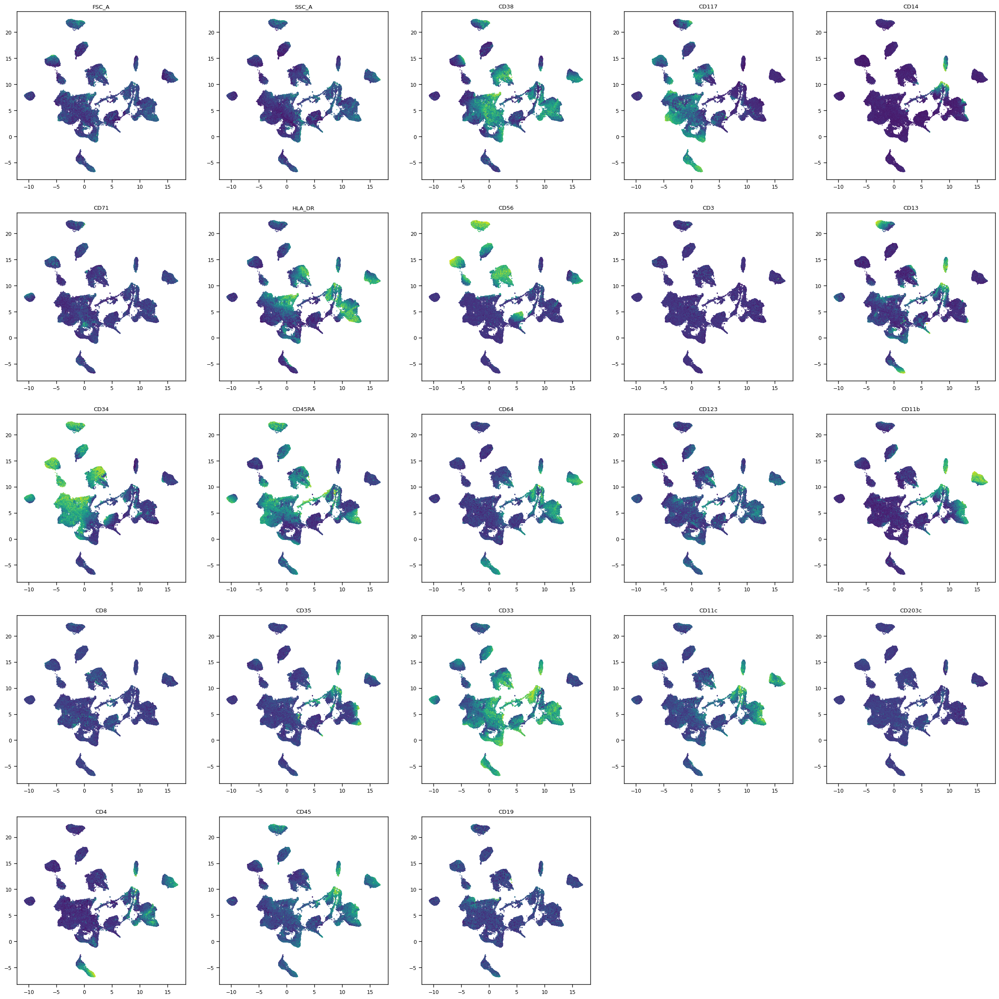

In [26]:
plot_all_markers(Y5, all_scaled_nh_expr, all_scaled_nh_expr.columns)
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Suppl_Figure1/Non_remission_marker_expression_umap.png")

<Axes: >

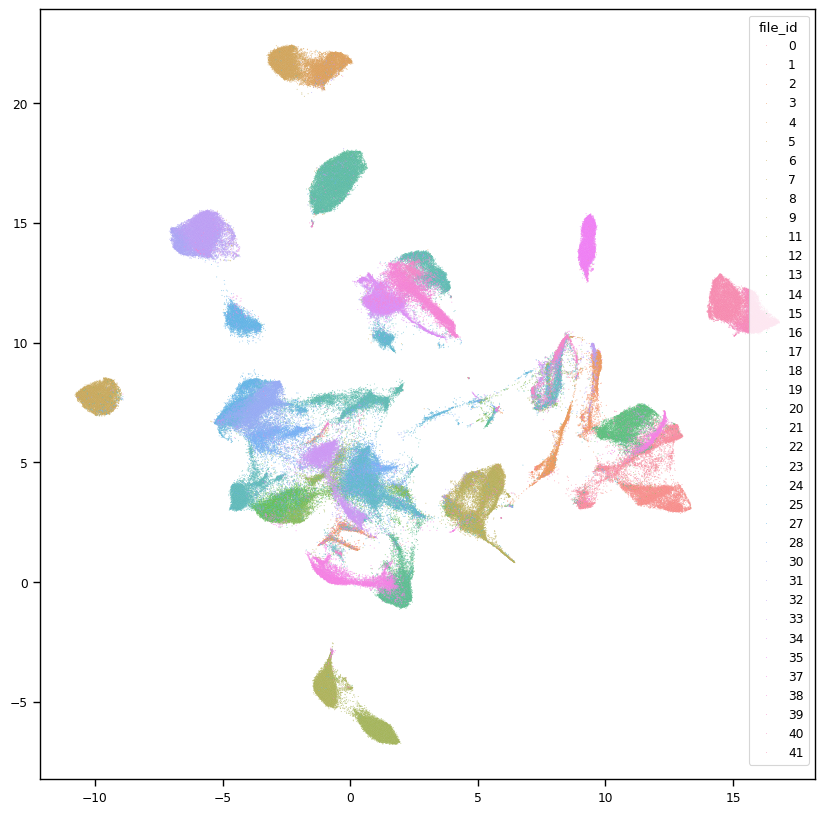

In [27]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x=Y5[:,0], y=Y5[:,1], hue=nh_meta["file_id"].astype("category"), alpha=0.6, s=0.5)

<Axes: >

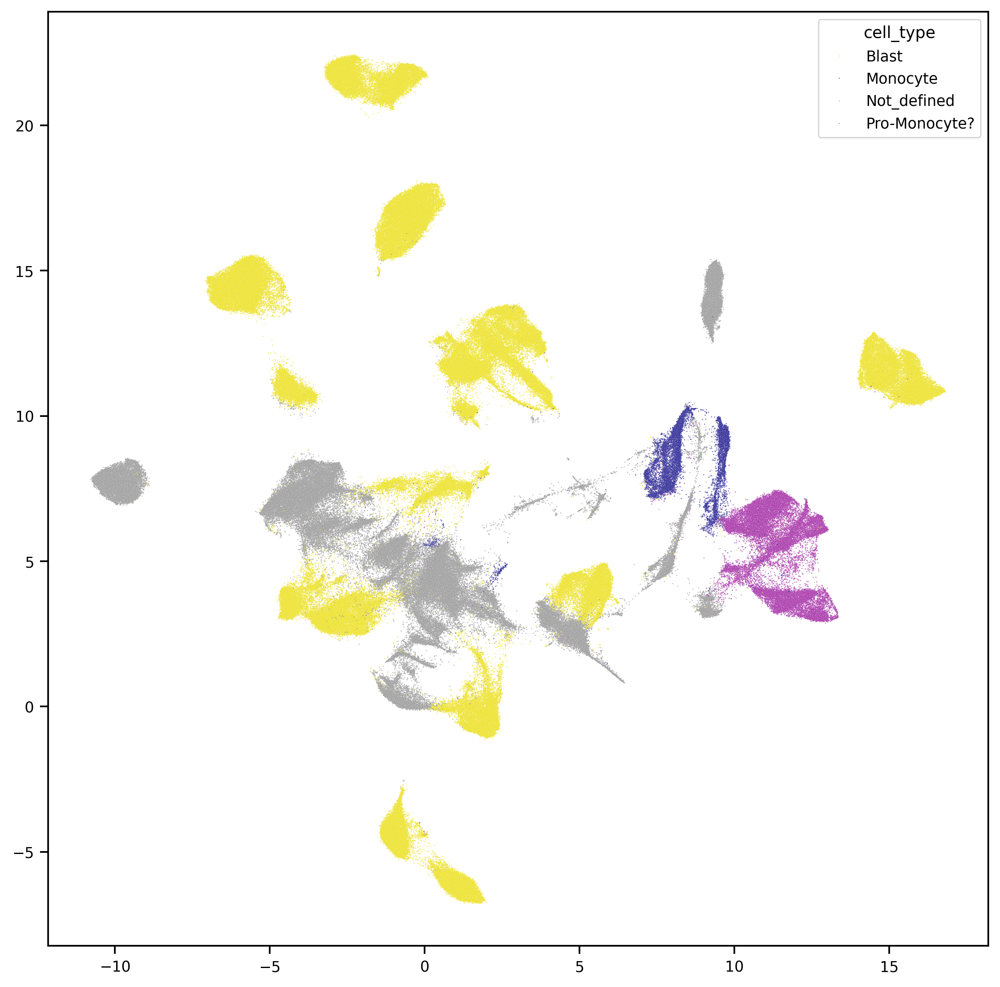

In [28]:
plt.figure(figsize=(10, 10), dpi=300)
sns.scatterplot(x=Y5[:,0], y=Y5[:,1], hue=nh_meta["cell_type"].astype("category"), alpha=0.6, s=0.5, palette=nh_ct_cmap)

<module 'matplotlib.pyplot' from '/Users/adr/miniconda3/envs/iPC_test/lib/python3.8/site-packages/matplotlib/pyplot.py'>

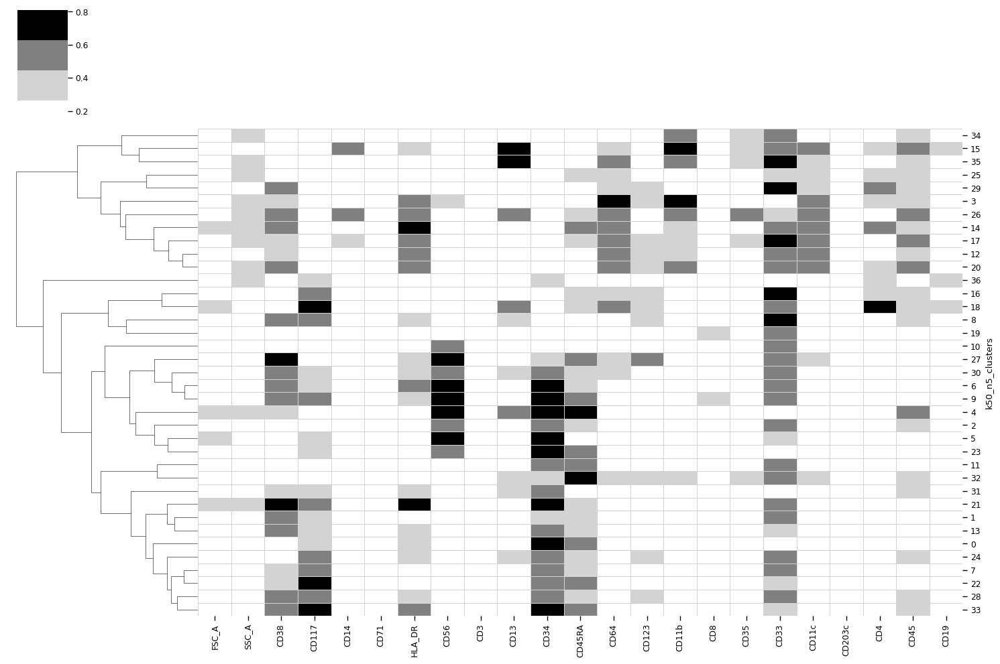

In [29]:
plot_bw_heatmap(all_scaled_nh_expr, meta_data = nh_clust, group_var="k50_n5_clusters")

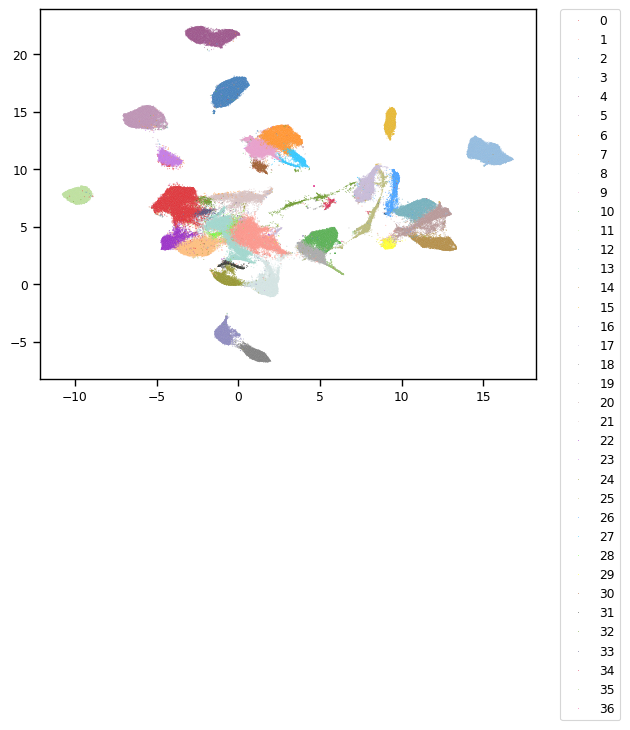

In [30]:
sns.scatterplot(x=Y5[:,0], y=Y5[:,1], hue=nh_clust["k50_n5_clusters"].astype("category"), 
                alpha=0.6, s=0.5, palette=colors[:len(nh_clust["k50_n5_clusters"].unique())])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


Text(1.4, 10.5, '14')

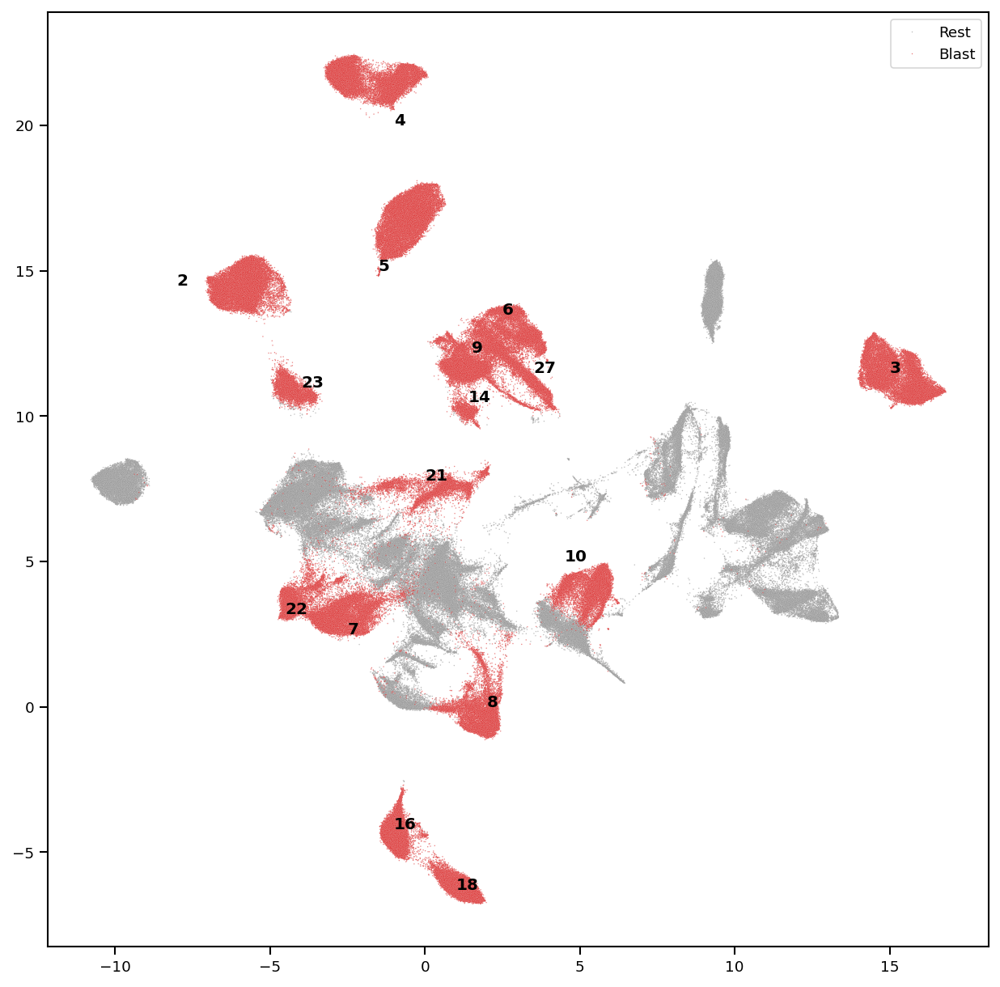

In [31]:
plt = UMAP_annotation_vs_rest(Y5, nh_meta["cell_type"], highlight="Blast", dpi=150, cmap=blast_vs_rest)

plt.text(-8, 14.5, "2", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-1.5, 15, "5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-1, 20, "4", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-4, 11, "23", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(15, 11.5, "3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-1, -4.2, "16", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(1, -6.3, "18", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(2, 0, "8", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(4.5, 5, "10", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-4.5, 3.2, "22", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(-2.5, 2.5, "7", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(0, 7.8, "21", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(2.5, 13.5, "6", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(3.5, 11.5, "27", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(1.5, 12.2, "9", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.text(1.4, 10.5, "14", horizontalalignment='left', size='medium', color='black', weight='semibold')
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Figure1/non_remission_cell_UMAP_numbered_clusters.png")

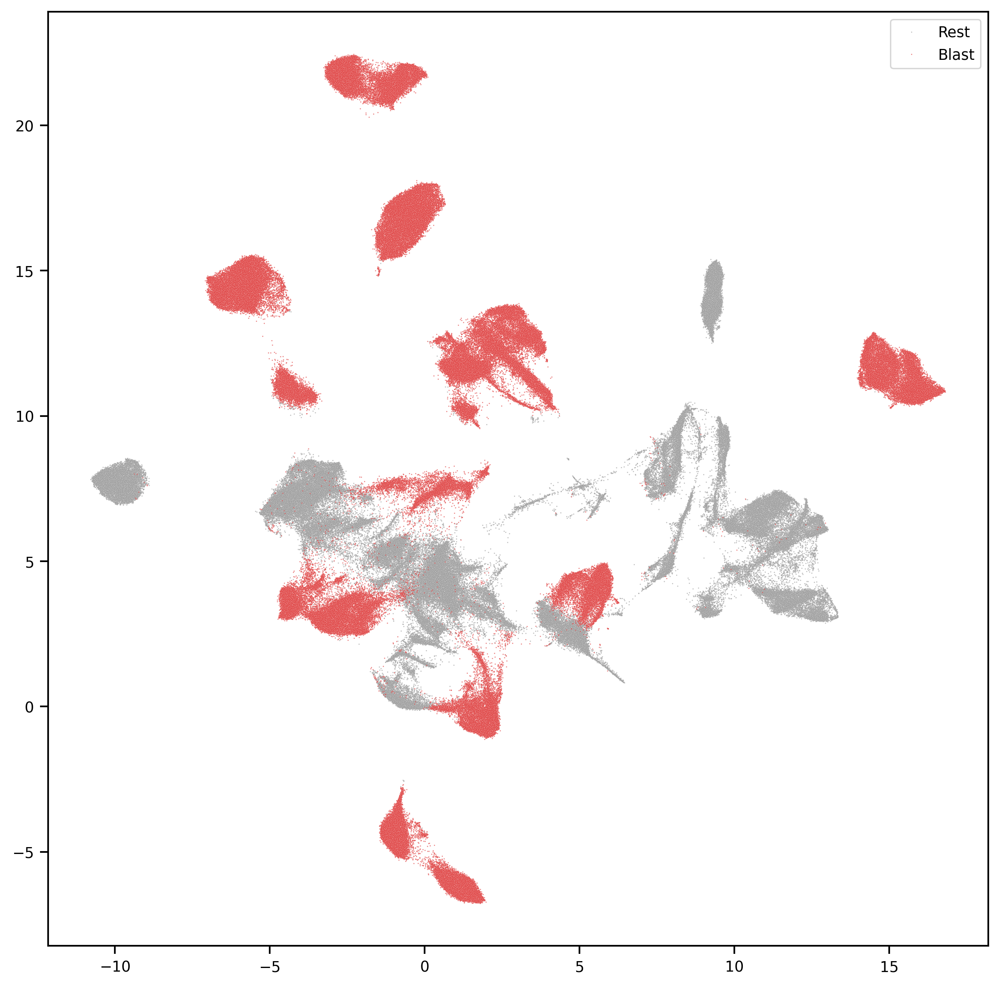

In [32]:
plt = UMAP_annotation_vs_rest(Y5, nh_meta["cell_type"], highlight="Blast", dpi=300, cmap=blast_vs_rest)
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Figure1/non_remission_cell_UMAP_cell_type.pdf")
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Figure1/non_remission_cell_UMAP_cell_type.png")



<module 'matplotlib.pyplot' from '/Users/adr/miniconda3/envs/iPC_test/lib/python3.8/site-packages/matplotlib/pyplot.py'>

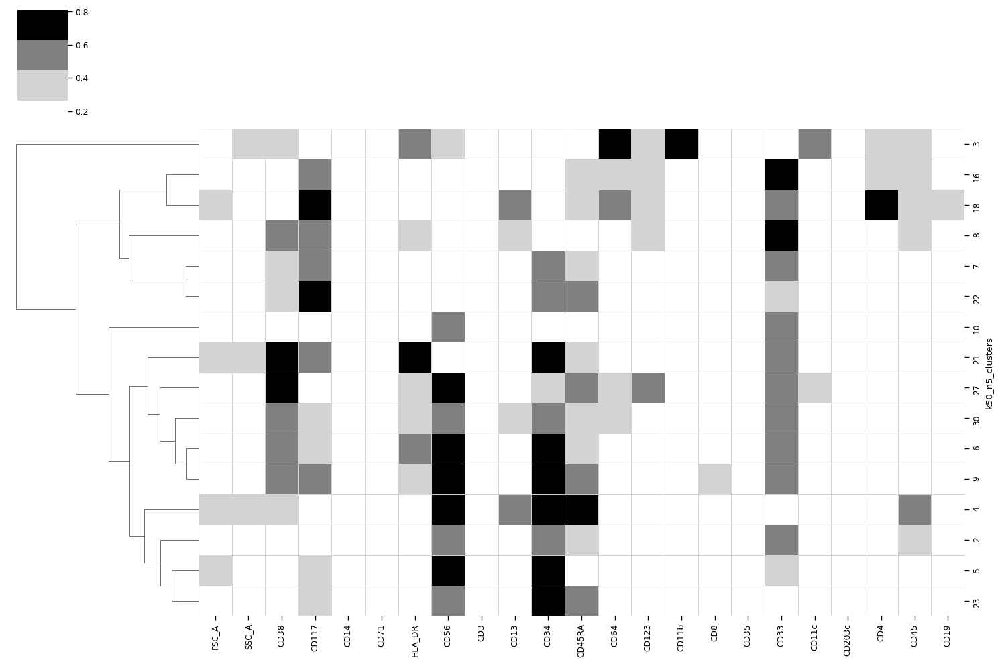

In [33]:
plot_bw_heatmap(all_scaled_nh_expr[nh_meta["cell_type"]=="Blast"], 
                meta_data = nh_clust[nh_meta["cell_type"]=="Blast"], group_var="k50_n5_clusters")
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Figure1/non_remission_cells_heatmap_avg_expr_per_cell_type.pdf")
# plt.savefig("/Users/adr/Box/iPC_AML/Documents/Manuscript/Figures/Figure1/non_remission_cells_heatmap_avg_expr_per_cell_type.png")


<module 'matplotlib.pyplot' from '/Users/adr/miniconda3/envs/iPC_test/lib/python3.8/site-packages/matplotlib/pyplot.py'>

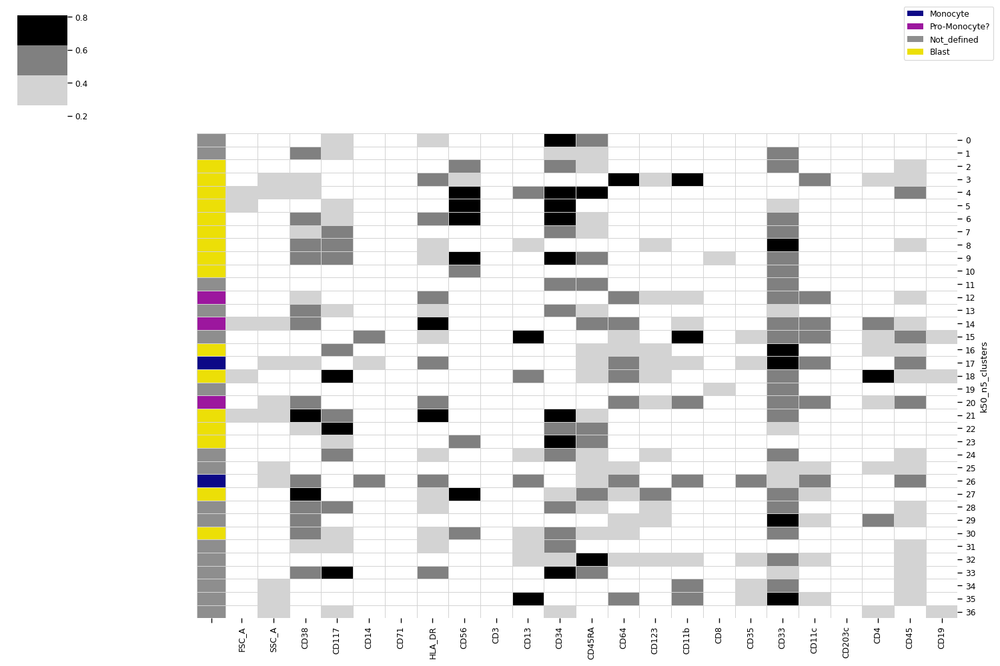

In [34]:
row_colors = pd.Series([anno_dict[i] for i in range(len(anno_dict))])
plot_bw_heatmap(all_scaled_nh_expr, 
                meta_data = nh_clust, group_var="k50_n5_clusters",
               row_colors=row_colors, cmap=nh_ct_cmap)

# Merge with previous cell meta

In [35]:
cell_meta = pd.read_csv("/Users/adr/Box/iPC_work/Local_files_for_paper/Updated/monocytic_meta_TP_patient_file_cluster.csv", index_col=0)
cell_meta

,time_point,patient_id,file_id,cluster_id
0,Diagnosis,PAUMTZ,0,20
1,Diagnosis,PAUMTZ,0,20
2,Diagnosis,PAUMTZ,0,20
3,Diagnosis,PAUMTZ,0,20
4,Diagnosis,PAUMTZ,0,20
...,...,...,...,...
350245,EOI I,TEST12378,42,23
350246,EOI I,TEST12378,42,23
350247,EOI I,TEST12378,42,23
350248,EOI I,TEST12378,42,23


In [36]:
cell_meta.loc[cell_meta["time_point"]=="EOI I", "healthy_cluster"] = rem_clust.values.astype(int)
cell_meta.loc[cell_meta["time_point"]=="EOI I", "cell_type"] = rem_meta["cell_type"].values

cell_meta.loc[cell_meta["time_point"]!="EOI I", "nh_cluster"] = nh_clust.values.astype(int)
cell_meta.loc[cell_meta["time_point"]!="EOI I", "cell_type"] = nh_meta["cell_type"].values

cell_meta

,time_point,patient_id,file_id,cluster_id,healthy_cluster,cell_type,nh_cluster
0,Diagnosis,PAUMTZ,0,20,NaN,Pro-Monocyte?,20.0
1,Diagnosis,PAUMTZ,0,20,NaN,Pro-Monocyte?,20.0
2,Diagnosis,PAUMTZ,0,20,NaN,Pro-Monocyte?,20.0
3,Diagnosis,PAUMTZ,0,20,NaN,Pro-Monocyte?,20.0
4,Diagnosis,PAUMTZ,0,20,NaN,Pro-Monocyte?,20.0
...,...,...,...,...,...,...,...
350245,EOI I,TEST12378,42,23,6.0,Monocyte,NaN
350246,EOI I,TEST12378,42,23,6.0,Monocyte,NaN
350247,EOI I,TEST12378,42,23,6.0,Monocyte,NaN
350248,EOI I,TEST12378,42,23,6.0,Monocyte,NaN


In [37]:
# cell_meta.to_csv("/Users/adr/Box/iPC_work/Local_files_for_paper/Updated/local_all_cells_meta_clust_celltype.csv")